<a href="https://colab.research.google.com/github/fx-manmeet/learn-ml-repo/blob/main/teserract_ocr.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Install PyTesseract and setup on Colab
!sudo apt install tesseract-ocr
!pip install pytesseract

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
tesseract-ocr is already the newest version (4.1.1-2.1build1).
0 upgraded, 0 newly installed, 0 to remove and 45 not upgraded.


In [ ]:
# Our Setup, Import Libaries, Create our Imshow Function and Download our Images
import cv2
import pytesseract
import numpy as np
from matplotlib import pyplot as plt

pytesseract.pytesseract.tesseract_cmd = (
    r'/usr/bin/tesseract'
)

# Define our imshow function
def imshow(title = "Image", image = None, size = 10):
    w, h = image.shape[0], image.shape[1]
    aspect_ratio = w/h
    plt.figure(figsize=(size * aspect_ratio,size))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title(title)
    plt.show()

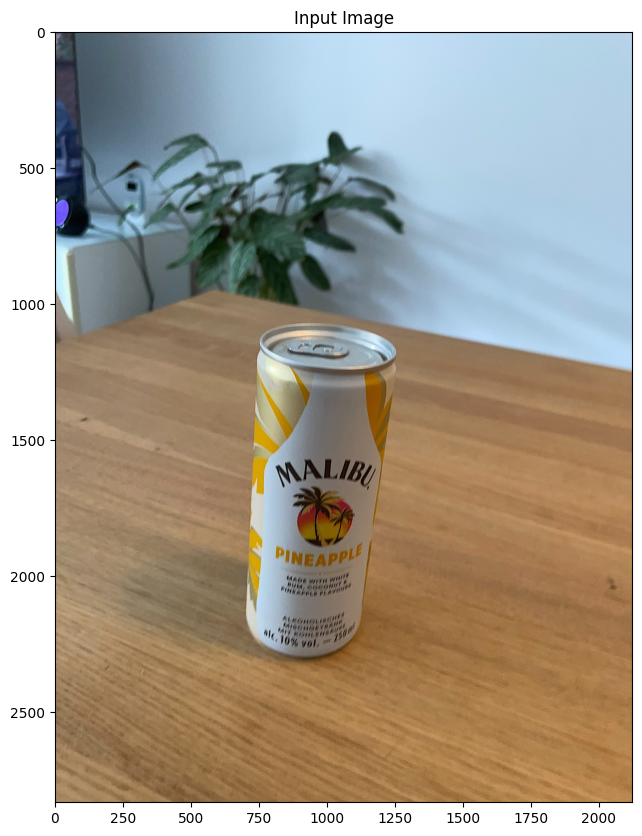

PyTesseract Extracted:  

 



In [ ]:
img = cv2.imread('/content/drive/MyDrive/OCR_Cardbord_images/1708520920522651.jpg')
imshow("Input Image", img)

# Run our image through PyTesseract
output_txt = pytesseract.image_to_string(img)

print("PyTesseract Extracted: {}".format(output_txt))

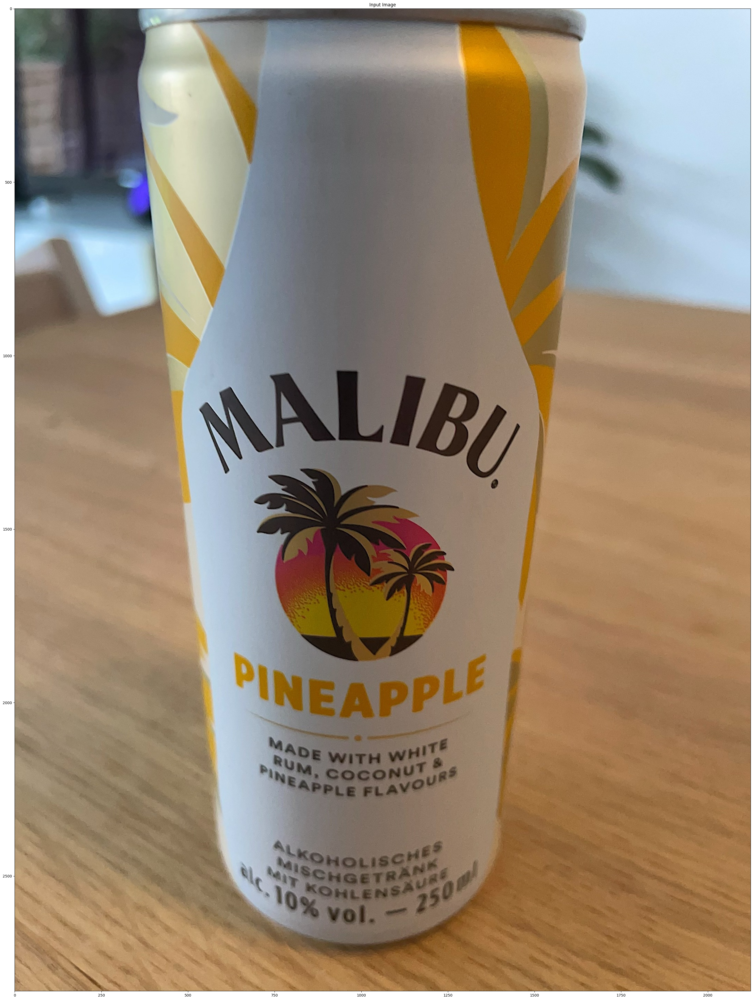

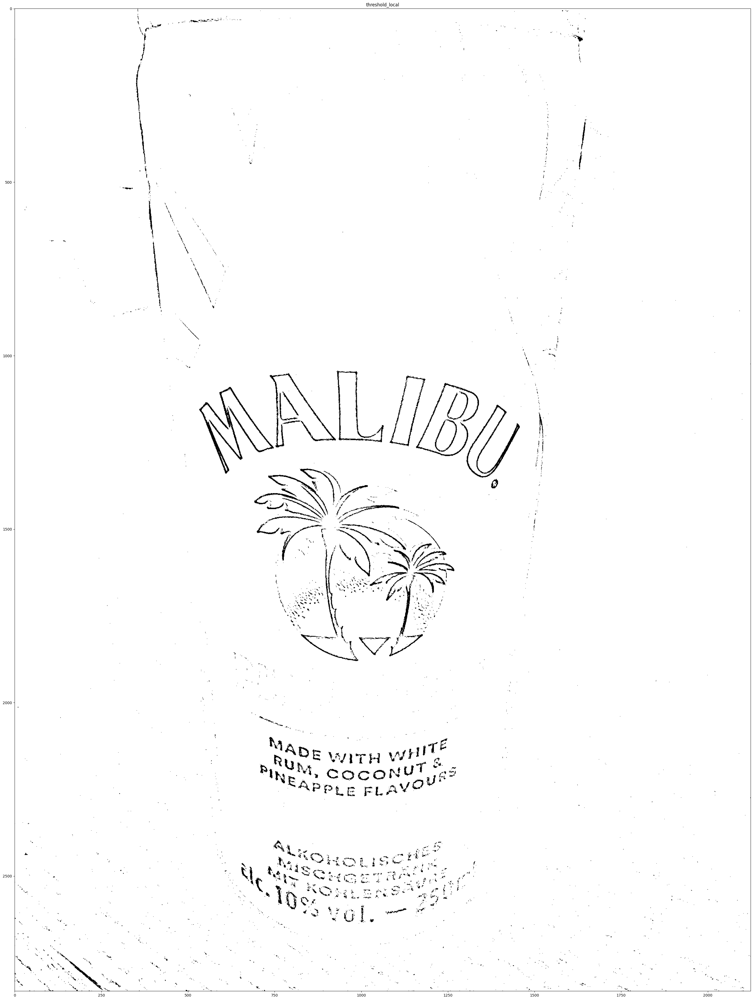

PyTesseract Extracted:  

Ny - , £
ROS WITH wT

wevh COCONUT jn8
“APPLE FLAY?

 



In [ ]:
from skimage.filters import threshold_local

image = cv2.imread('/content/drive/MyDrive/OCR_Cardbord_images/1708520932181342.jpg')
imshow("Input Image", image, size = 48)

# We get the Value component from the HSV color space
# then we apply adaptive thresholdingto
V = cv2.split(cv2.cvtColor(image, cv2.COLOR_BGR2HSV))[2]
T = threshold_local(V, 25, offset=15, method="gaussian")

# Apply the threshold operation
thresh = (V > T).astype("uint8") * 255
imshow("threshold_local", thresh, size = 48)

output_txt = pytesseract.image_to_string(thresh)
print("PyTesseract Extracted: {}".format(output_txt))

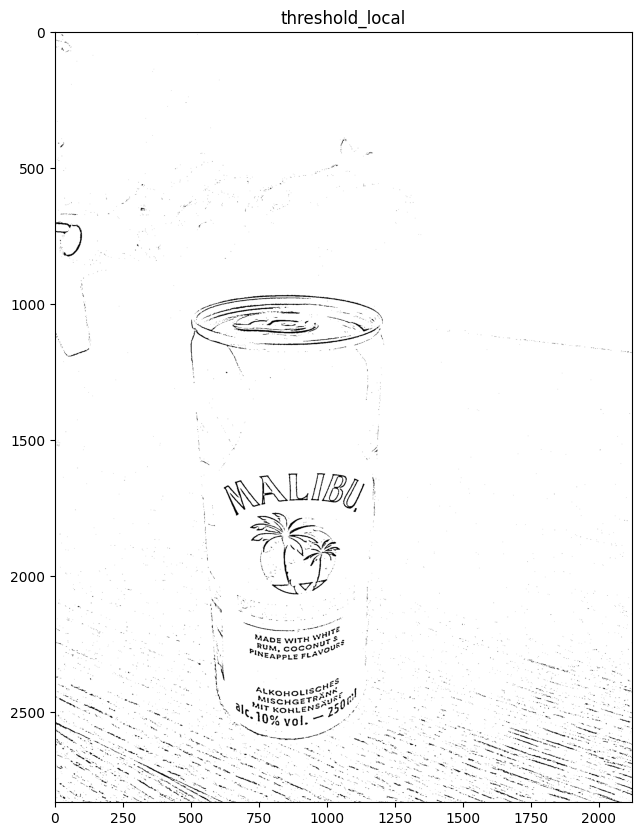

PyTesseract Extracted:  

 

 

 

. XS Ue tir KOHLENS z

 

HALIBY

 

~ . wet 4

1 ee ee “"
* emi it
Mabe WITH wee S,
Bb UM, cocoNn gue”
INEAPpLE FLAY

ne?
SENEE

ALKOHOLI fa
av" gt

MIscHGET

Ow

 

  



In [ ]:
from skimage.filters import threshold_local

image = cv2.imread('/content/drive/MyDrive/OCR_Cardbord_images/1708521113292892.jpg')

# We get the Value component from the HSV color space
# then we apply adaptive thresholdingto
V = cv2.split(cv2.cvtColor(image, cv2.COLOR_BGR2HSV))[2]
T = threshold_local(V, 25, offset=15, method="gaussian")

# Apply the threshold operation
thresh = (V > T).astype("uint8") * 255
imshow("threshold_local", thresh)

output_txt = pytesseract.image_to_string(thresh)
print("PyTesseract Extracted: {}".format(output_txt))

In [ ]:
from pytesseract import Output

d = pytesseract.image_to_data(thresh, output_type = Output.DICT)
print(d.keys())

dict_keys(['level', 'page_num', 'block_num', 'par_num', 'line_num', 'word_num', 'left', 'top', 'width', 'height', 'conf', 'text'])


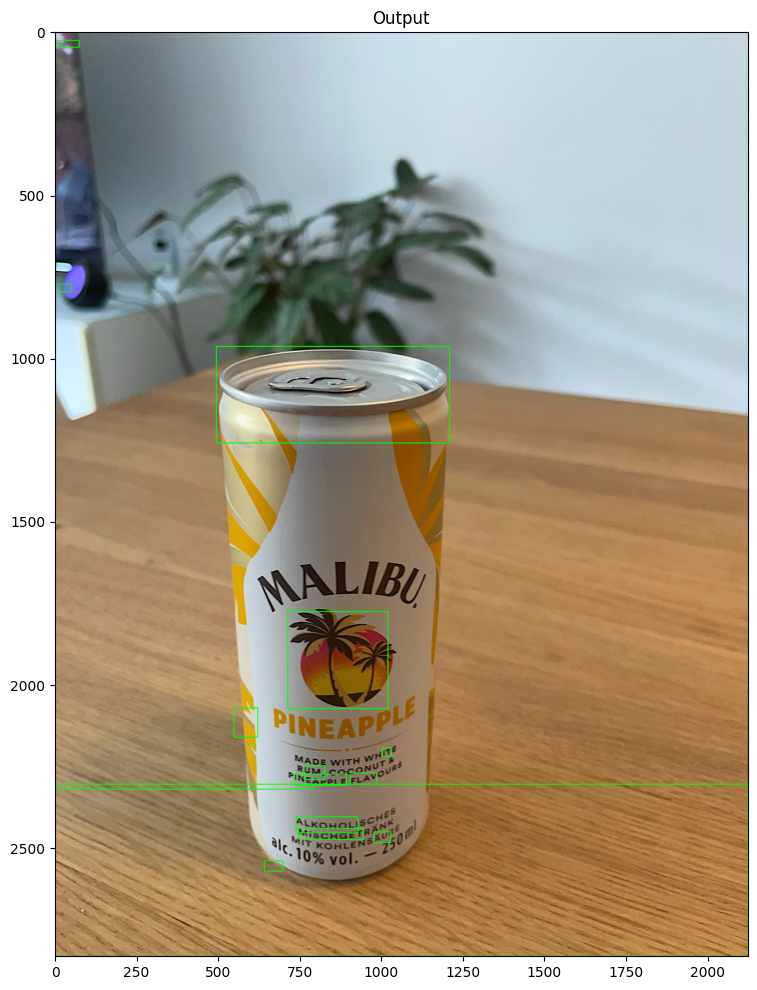

In [ ]:
n_boxes = len(d['text'])

for i in range(n_boxes):
    if int(d['conf'][i]) > 60:
        (x, y, w, h) = (d['left'][i], d['top'][i], d['width'][i], d['height'][i])
        image = cv2.rectangle(image, (x, y), (x + w, y + h), (0, 255, 0), 2)

imshow('Output', image, size = 12)

In [ ]:
import cv2
import numpy as np
img = cv2.imread('image.jpg')
# get grayscale image
def get_grayscale(image):
    return cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
# noise removal
def remove_noise(image):
    return cv2.medianBlur(image,5)

#thresholding
def thresholding(image):
    return cv2.threshold(image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]
#dilation
def dilate(image):
    kernel = np.ones((5,5),np.uint8)
    return cv2.dilate(image, kernel, iterations = 1)

#erosion
def erode(image):
    kernel = np.ones((5,5),np.uint8)
    return cv2.erode(image, kernel, iterations = 1)
#opening - erosion followed by dilation
def opening(image):
    kernel = np.ones((5,5),np.uint8)
    return cv2.morphologyEx(image, cv2.MORPH_OPEN, kernel)
#canny edge detection
def canny(image):
    return cv2.Canny(image, 100, 200)
#skew correction
def deskew(image):
    coords = np.column_stack(np.where(image > 0))
    angle = cv2.minAreaRect(coords)[-1]
    if angle < -45:
        angle = -(90 + angle)
    else:
        angle = -angle
    (h, w) = image.shape[:2]
    center = (w // 2, h // 2)
    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    rotated = cv2.warpAffine(image, M, (w, h), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)
    return rotated
#template matching
def match_template(image, template):
    return cv2.matchTemplate(image, template, cv2.TM_CCOEFF_NORMED)

In [ ]:
image = cv2.imread('/content/drive/MyDrive/OCR_Cardbord_images/1708520932181342.jpg')
gray = get_grayscale(image)
thresh = thresholding(gray)
opening = opening(gray)
canny = canny(gray)

In [ ]:
import pytesseract

In [ ]:
output_txt1 = pytesseract.image_to_string(canny)
print("PyTesseract Extracted: {}".format(output_txt1))

PyTesseract Extracted:  

ra

ane

{§ VV oe
Por ene Tom

=

alae



In [ ]:
from google.colab.patches import cv2_imshow

In [ ]:
##ocropus
# Install dependencies
!apt-get update
!apt-get install -y software-properties-common
!add-apt-repository universe
!apt-get update
!apt-get install -y wget python3-pip python3-dev python3-venv
!pip install cython numpy scipy pillow matplotlib scikit-image
!pip install PyYAML

# Clone OCRopus repository and install
!git clone https://github.com/tmbdev/ocropy.git
!cd ocropy && sudo python3 setup.py install


Get:1 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease [3,626 B]
Hit:2 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease
Get:3 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ Packages [53.5 kB]
Hit:4 http://archive.ubuntu.com/ubuntu jammy InRelease
Get:5 http://security.ubuntu.com/ubuntu jammy-security InRelease [129 kB]
Get:6 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [128 kB]
Get:7 http://security.ubuntu.com/ubuntu jammy-security/main amd64 Packages [1,896 kB]
Hit:8 http://archive.ubuntu.com/ubuntu jammy-backports InRelease
Get:9 http://archive.ubuntu.com/ubuntu jammy-updates/restricted amd64 Packages [2,523 kB]
Hit:10 https://ppa.launchpadcontent.net/c2d4u.team/c2d4u4.0+/ubuntu jammy InRelease
Get:11 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease [18.1 kB]
Get:12 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease [24.3 kB]
Hit:13 https://ppa.launchpadcon

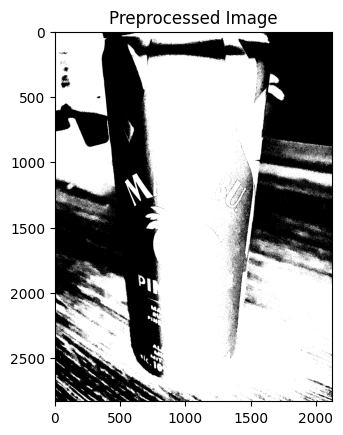

In [ ]:
import cv2
import matplotlib.pyplot as plt
# Get the image path
image_path = '/content/drive/MyDrive/OCR_Cardbord_images/1708520932181342.jpg'

# Load and preprocess the image
image = cv2.imread(image_path)
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
_, binary = cv2.threshold(gray, 128, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

# Save the preprocessed image
preprocessed_path = 'preprocessed_image.png'
cv2.imwrite(preprocessed_path, binary)

# Display the preprocessed image
plt.imshow(binary, cmap='gray')
plt.title('Preprocessed Image')
plt.show()


In [ ]:
# Run OCRopus commands
!ocropus-nlbin preprocessed_image.png -o preprocessed_image
!ocropus-gpageseg -n preprocessed_image/0001.bin.png
!ocropus-rpred -Q 4 preprocessed_image/0001/*.png


/bin/bash: line 1: ocropus-nlbin: command not found
/bin/bash: line 1: ocropus-gpageseg: command not found
/bin/bash: line 1: ocropus-rpred: command not found


In [ ]:
# Extract the recognized text
import os

recognized_text = ''
text_files = sorted([f for f in os.listdir('preprocessed_image/0001') if f.endswith('.txt')])
for text_file in text_files:
    with open(os.path.join('preprocessed_image/0001', text_file), 'r') as f:
        recognized_text += f.read() + '\n'

print(recognized_text)


FileNotFoundError: [Errno 2] No such file or directory: 'preprocessed_image/0001'

In [ ]:
# Run OCRopus commands, explicitly specifying output directory
!ocropus-nlbin preprocessed_image.png -o preprocessed_image
!ocropus-gpageseg -n preprocessed_image/0001.bin.png -o preprocessed_image/0001
!ocropus-rpred -Q 4 preprocessed_image/0001/*.png -o preprocessed_image/0001

/bin/bash: line 1: ocropus-nlbin: command not found
/bin/bash: line 1: ocropus-gpageseg: command not found
/bin/bash: line 1: ocropus-rpred: command not found


In [ ]:
!ocropus-version

/bin/bash: line 1: ocropus-version: command not found


In [ ]:
!pip install easyocr

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 9.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 908.3/908.3 kB 16.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 307.2/307.2 kB 15.4 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manyli

In [ ]:
import easyocr
reader = easyocr.Reader(['tr','en'])

Progress: |██████████████████████████████████████████████████| 100.0% Complete

Progress: |██████████████████████████████████████████████████| 100.0% Complete

In [ ]:
results = reader.readtext('/content/drive/MyDrive/OCR_Cardbord_images/1708520918257236.jpg')

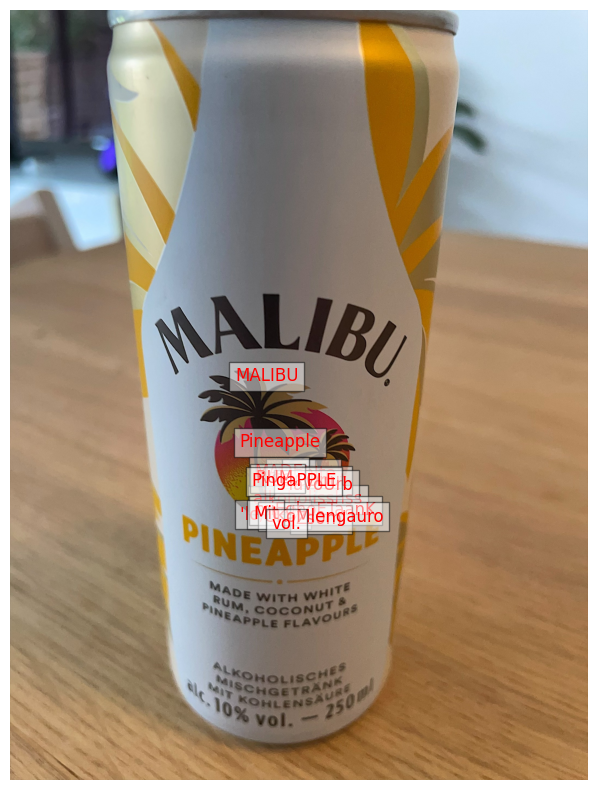

In [ ]:
def display_image_with_boxes(image, results):
    # Convert image from BGR to RGB (since OpenCV loads images in BGR format)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Plot the image
    plt.figure(figsize=(10, 10))
    plt.imshow(image_rgb)

    # Add bounding boxes and text annotations
    for (bbox, text, prob) in results:
        # Unpack the bounding box coordinates
        (top_left, top_right, bottom_right, bottom_left) = bbox
        top_left = tuple([int(coord) for coord in top_left])
        top_right = tuple([int(coord) for coord in top_right])
        bottom_right = tuple([int(coord) for coord in bottom_right])
        bottom_left = tuple([int(coord) for coord in bottom_left])

        # Draw the bounding box
        cv2.rectangle(image_rgb, top_left, bottom_right, (0, 255, 0), 2)

        # Annotate the image with the detected text
        plt.text(top_left[0], top_left[1] - 10, text, fontsize=12, color='red', bbox=dict(facecolor='white', alpha=0.5))

    plt.axis('off')
    plt.show()

# Display the image with the detected text
display_image_with_boxes(image, results)